# Dynamic Programming

## `FrozenLake-v0`

![alt_text](https://cdn-images-1.medium.com/max/1600/1*Zf_ozFRh4ZqhOI-RfkZfxA.gif)

**The agent controls the movement of a character in a grid world. Some tiles of the grid are walkable, and others lead to the agent falling into the water. Additionally, the movement direction of the agent is uncertain and only partially depends on the chosen direction. The agent is rewarded for finding a walkable path to a goal tile.**

`Winter is here. You and your friends were tossing around a frisbee at the park when you made a wild throw that left the frisbee out in the middle of the lake. The water is mostly frozen, but there are a few holes where the ice has melted. If you step into one of those holes, you'll fall into the freezing water. At this time, there's an international frisbee shortage, so it's absolutely imperative that you navigate across the lake and retrieve the disc. However, the ice is slippery, so you won't always move in the direction you intend.`

The surface is described using a grid like the following:

SFFF       (S: starting point, safe)

FHFH       (F: frozen surface, safe)

FFFH       (H: hole, fall to your doom)

HFFG       (G: goal, where the frisbee is located)

The episode ends when you reach the goal or fall in a hole. You receive a reward of 1 if you reach the goal, and zero otherwise.


### Steps to solving FrozenLake-v0 using Dynammic Progamming
 * > #### Part - 1 : Exploring the FrozenLake
 * > #### Part - 2 : Policy Evaluation
 * > #### Part - 3 : Obtain $q_\pi$  from $v_\pi$ 
 * > #### Part - 4 : Policy Improvement 
 * > #### Part - 5 : Policy Iteration 
 * > #### Part - 6 : Truncated Policy Evaluation
 * > #### Part - 7 : Truncated Policy Iteration
 * > #### Part - 8 : Value Iteration

### Part - 0 Importing Dependencies

In [185]:
import numpy as np
import sys
import gym
from frozenlake import FrozenLakeEnv
from plot_utils import plot_values
import warnings
warnings.filterwarnings('ignore')

### Part - 1  Exploring the Environment

In [186]:
env = FrozenLakeEnv()

In [187]:
print("Number of Observation Space: ",env.nS)
print("Number of Action Space: ",env.nA)

Number of Observation Space:  16
Number of Action Space:  4


In [188]:
print(env.observation_space)
print(env.action_space)

Discrete(16)
Discrete(4)


In [189]:
print("Step Transition Probablity of state [0][0]: \n")
env.P[0][0]

Step Transition Probablity of state [0][0]: 



[(0.3333333333333333, 0, 0.0, False),
 (0.3333333333333333, 0, 0.0, False),
 (0.3333333333333333, 4, 0.0, False)]

### Part 2 - Iterative Policy Evaluation

In [190]:
def policy_evaluation(env,policy,gamma=1,theta=1e-8):
    V = np.zeros(env.nS)
    while True:
        delta = 0
        for s in range(env.nS):
            Vs = 0
            for a, action_prob in enumerate(policy[s]):
                for prob, next_state, reward, done in env.P[s][a]:
                    Vs += action_prob*prob*(reward + gamma*V[next_state])
            delta = max(delta, np.abs(Vs-V[s]))
            V[s] = Vs
        if delta < theta:
            break
    return V

In [231]:
random_policy = np.ones([env.nS,env.nA])/(env.nA)

In [232]:
random_policy

array([[0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25]])

In [233]:
V = policy_evaluation(env,random_policy)

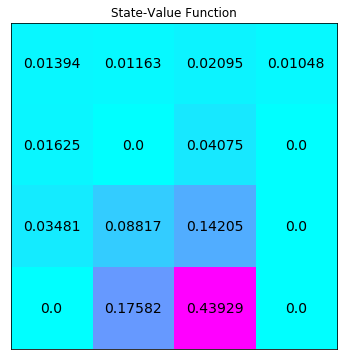

In [234]:
plot_values(V)

### Part - 3 Obtain $q_\pi$  from $v_\pi$ 

In [235]:
def q_from_v(env,V,s,gamma=1):
    q = np.zeros(env.nA)
    for a in range(env.nA):
        for prob, next_state, reward, done in env.P[s][a]:
            q[a] += prob * (reward + gamma*V[next_state])
    return q

In [237]:
q = np.zeros([env.nS,env.nA])
for s in range(env.nS):
    q[s] = q_from_v(env,V,s)

In [239]:
print("Action - Value Function : \n" , q)

Action - Value Function : 
 [[0.0147094  0.01393978 0.01393978 0.01317015]
 [0.00852356 0.01163091 0.0108613  0.01550788]
 [0.02444514 0.02095298 0.02406033 0.01435346]
 [0.01047649 0.01047649 0.00698432 0.01396865]
 [0.02166487 0.01701828 0.01624865 0.01006281]
 [0.         0.         0.         0.        ]
 [0.05433538 0.04735105 0.05433538 0.00698432]
 [0.         0.         0.         0.        ]
 [0.01701828 0.04099204 0.03480619 0.04640826]
 [0.07020885 0.11755991 0.10595784 0.05895312]
 [0.18940421 0.17582037 0.16001424 0.04297382]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.08799677 0.20503718 0.23442716 0.17582037]
 [0.25238823 0.53837051 0.52711478 0.43929118]
 [0.         0.         0.         0.        ]]


### Part 4 - Policy Improvement

In [253]:
def policy_improvement(env,V,gamma=1):
    policy = np.zeros([env.nS,env.nA])
    for s in range(env.nS):
        q = q_from_v(env,V,s)
        best_a = np.argwhere(q == np.max(q))
        policy[s] = np.sum([np.eye(env.nA)[i] for i in best_a],axis=0)/len(best_a)
    return policy
    

In [254]:
policy_improvement(env,V)

array([[1.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.  ],
       [1.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.  ],
       [1.  , 0.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25],
       [0.5 , 0.  , 0.5 , 0.  ],
       [0.25, 0.25, 0.25, 0.25],
       [0.  , 0.  , 0.  , 1.  ],
       [0.  , 1.  , 0.  , 0.  ],
       [1.  , 0.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.  , 0.  , 1.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25]])

### Part 5 - Policy Iteration

In [268]:
def policy_iteration_1(env,gamma=1,theta=1e-8):
    policy = np.ones([env.nS,env.nA])/env.nA
    while True:
        policy_stable = False
        
        V = policy_evaluation(env,policy)
        new_policy = policy_improvement(env,V)
        
        plot_values(V)
        print("Policy: \n",policy)
        
        if((new_policy==policy).all()):
            policy_stable=True
        if(policy_stable==True):
            break
        
        policy = new_policy
    return V, policy

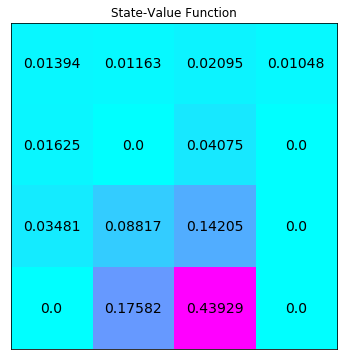

Policy: 
 [[0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]]


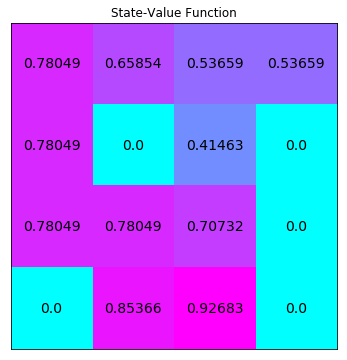

Policy: 
 [[1.   0.   0.   0.  ]
 [0.   0.   0.   1.  ]
 [1.   0.   0.   0.  ]
 [0.   0.   0.   1.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.5  0.   0.5  0.  ]
 [0.25 0.25 0.25 0.25]
 [0.   0.   0.   1.  ]
 [0.   1.   0.   0.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.   0.   1.   0.  ]
 [0.   1.   0.   0.  ]
 [0.25 0.25 0.25 0.25]]


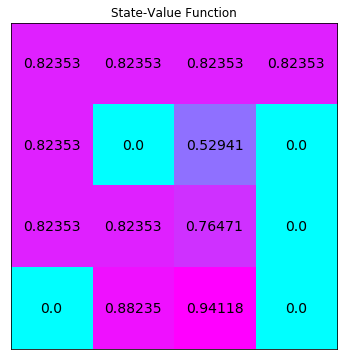

Policy: 
 [[1.   0.   0.   0.  ]
 [0.   0.   0.   1.  ]
 [0.   0.   0.   1.  ]
 [0.   0.   0.   1.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.5  0.   0.5  0.  ]
 [0.25 0.25 0.25 0.25]
 [0.   0.   0.   1.  ]
 [0.   1.   0.   0.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.   0.   1.   0.  ]
 [0.   1.   0.   0.  ]
 [0.25 0.25 0.25 0.25]]


In [269]:
V, policy = policy_iteration_1(env)

In [270]:
def policy_iteration_2(env,gamma=1,theta=1e-8):
    policy = np.ones([env.nS,env.nA])/env.nA
    while True:
        V = policy_evaluation(env,policy)
        new_policy = policy_improvement(env,V)
        
        plot_values(V)
        print("Policy: \n",policy)
        
        if(np.max(np.abs(policy_evaluation(env,policy)-policy_evaluation(env,new_policy)))<theta):
            break
        
        policy = new_policy
    return V, policy

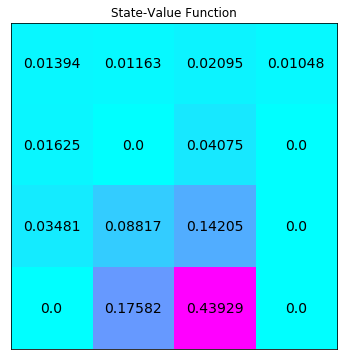

Policy: 
 [[0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]]


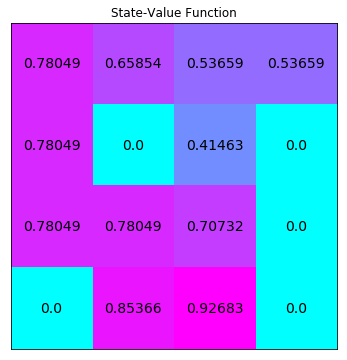

Policy: 
 [[1.   0.   0.   0.  ]
 [0.   0.   0.   1.  ]
 [1.   0.   0.   0.  ]
 [0.   0.   0.   1.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.5  0.   0.5  0.  ]
 [0.25 0.25 0.25 0.25]
 [0.   0.   0.   1.  ]
 [0.   1.   0.   0.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.   0.   1.   0.  ]
 [0.   1.   0.   0.  ]
 [0.25 0.25 0.25 0.25]]


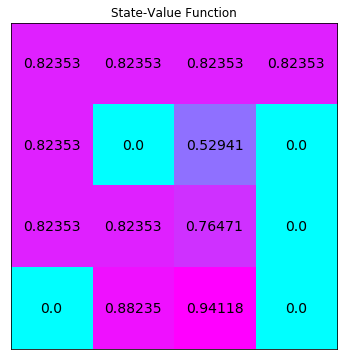

Policy: 
 [[1.   0.   0.   0.  ]
 [0.   0.   0.   1.  ]
 [0.   0.   0.   1.  ]
 [0.   0.   0.   1.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.5  0.   0.5  0.  ]
 [0.25 0.25 0.25 0.25]
 [0.   0.   0.   1.  ]
 [0.   1.   0.   0.  ]
 [1.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.25]
 [0.25 0.25 0.25 0.25]
 [0.   0.   1.   0.  ]
 [0.   1.   0.   0.  ]
 [0.25 0.25 0.25 0.25]]


In [271]:
V, policy = policy_iteration_2(env)

### Part 6 - Truncated Policy Evaluation

In [298]:
import copy

In [299]:
def truncated_policy_evaluation(env, policy, V, max_it=1, gamma=1):
    num_it=0
    while num_it < max_it:
        for s in range(env.nS):
            v = 0
            q = q_from_v(env, V, s, gamma)
            for a, action_prob in enumerate(policy[s]):
                v += action_prob * q[a]
            V[s] = v
        num_it += 1
    return V

### Part 7 - Truncated Policy Iteration

In [303]:
def truncated_policy_iteration(env, max_it=1, gamma=1, theta=1e-8):
    V = np.zeros(env.nS)
    policy = np.zeros([env.nS, env.nA]) / env.nA
    while True:
        policy = policy_improvement(env, V)
        old_V = copy.copy(V)
        V = truncated_policy_evaluation(env, policy, V, max_it, gamma)
        if max(abs(V-old_V)) < theta:
            break;
        plot_values(V)
    return policy, V

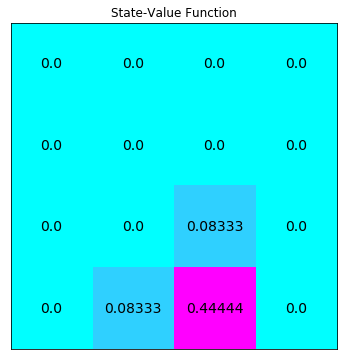

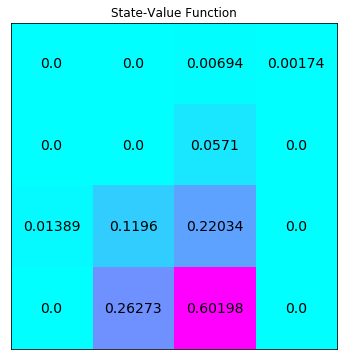

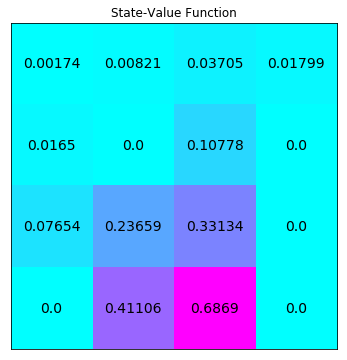

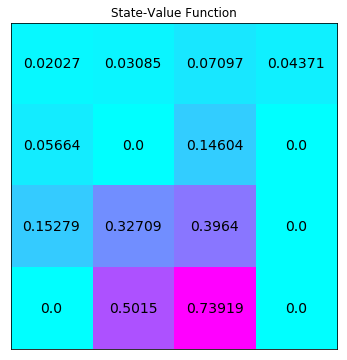

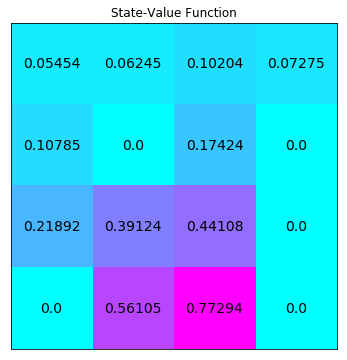

...

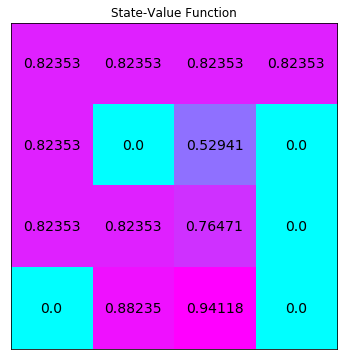

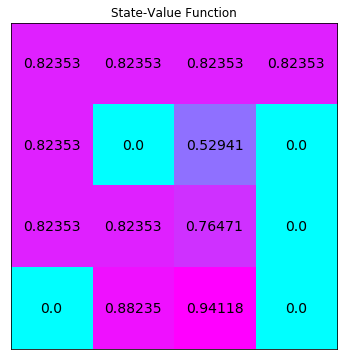

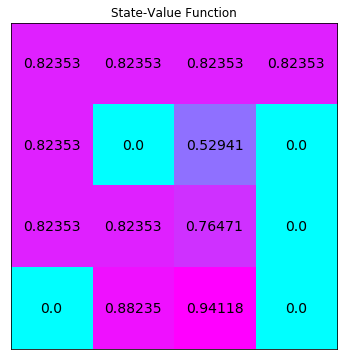

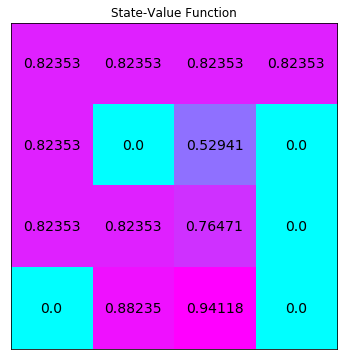

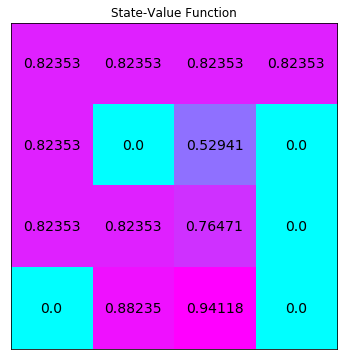

In [304]:
policy_tpi, V_tpi = truncated_policy_iteration(env, max_it=2)

### Part 8 - Value Iteration

In [309]:
def value_iteration(env,gamma=1,theta=1e-8):
    V = np.zeros(env.nS)
    while True:
        delta = 0
        for s in range(env.nS):
            v = V[s]
            V[s] = max(q_from_v(env,V,s))
            delta = max(delta,np.abs(v-V[s]))
        if delta < theta:
            break
        plot_values(V)
        policy = policy_improvement(env,V)
    return V, policy            

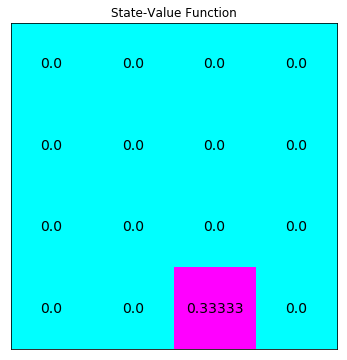

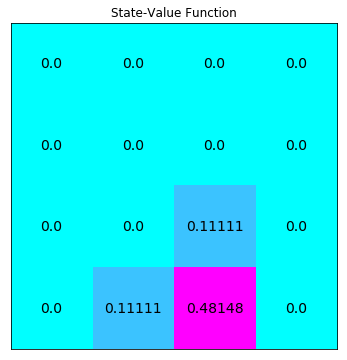

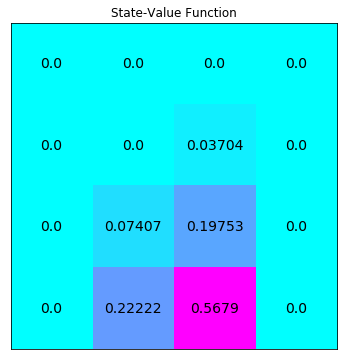

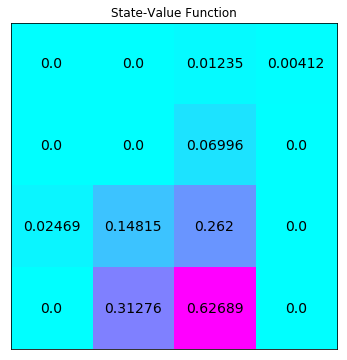

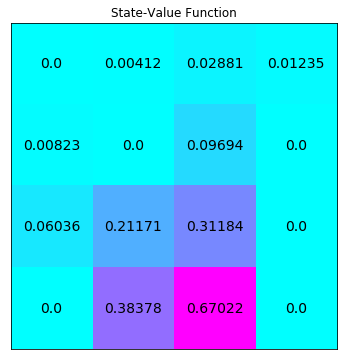

...

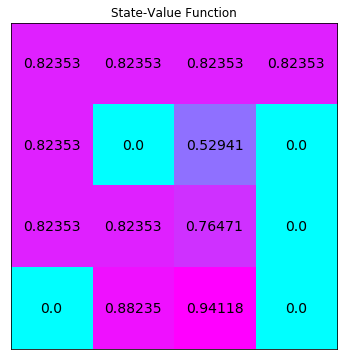

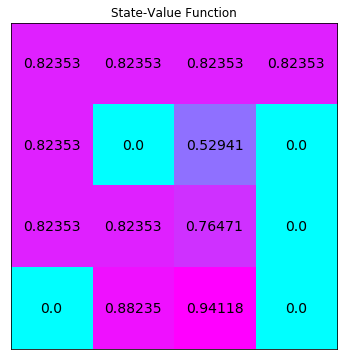

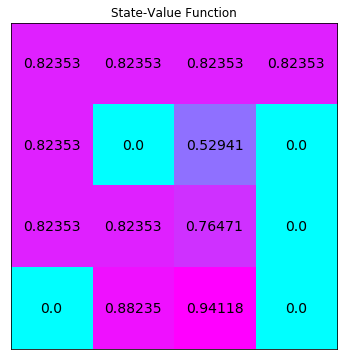

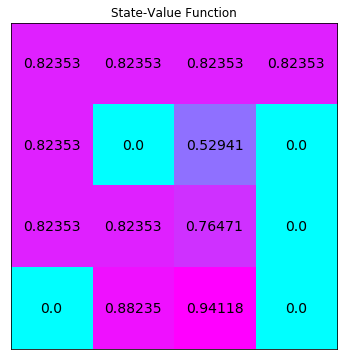

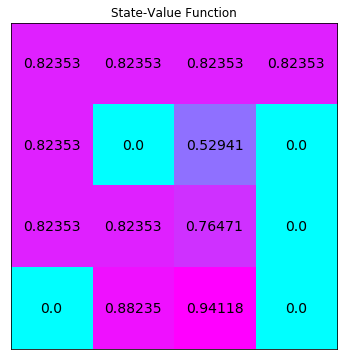

In [310]:
V, policy = value_iteration(env)

In [311]:
policy

array([[1.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 1.  ],
       [0.  , 0.  , 0.  , 1.  ],
       [0.  , 0.  , 0.  , 1.  ],
       [1.  , 0.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25],
       [0.5 , 0.  , 0.5 , 0.  ],
       [0.25, 0.25, 0.25, 0.25],
       [0.  , 0.  , 0.  , 1.  ],
       [0.  , 1.  , 0.  , 0.  ],
       [1.  , 0.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25],
       [0.25, 0.25, 0.25, 0.25],
       [0.  , 0.  , 1.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  ],
       [0.25, 0.25, 0.25, 0.25]])